In [3]:
import seaborn as sns
import matplotlib
import pandas as pd
from matplotlib import pyplot as plt
from bs4 import BeautifulSoup as BS
import requests as r
import numpy as np

In [4]:
df=pd.read_csv('Fashion&Instagram.csv').drop("Unnamed: 0",axis=1)
df.sample(5)

,UserId,PostId,Followings,Followers,MediaCount,BrandName,BrandCategory,BrandFollowers,Hashtags,Caption,...,ProductOnly,Face,Logo,BrandLogo,Smile,Outdoor,NumberOfPeople,NumberOfFashionProduct,Emotion,Emotion_value
1746,1429696931,1166689131437109814,7501,12158,1312,Dvf,Designer,1 979 918,25,28,...,0.04,0.23,0.17,0.04,0.02,0.21,0.75,2.31,NaN,0.00
3461,2105859526,1165945650782059835,7493,9050,775,Kiton,Small couture,160 447,24,79,...,0.11,0.07,0.00,0.01,0.02,0.01,0.48,4.24,NaN,0.00
5071,1999768969,1171444138713680452,1188,8158,2659,Tiffany,Mega couture,11 113 807,10,17,...,0.00,0.97,0.12,0.03,0.32,0.02,1.49,2.07,Neutral,0.67
4884,2359584928,1171828436743554778,972,20195,980,Stellamccartney,Designer,6 268 992,28,41,...,0.99,0.00,1.00,0.36,0.00,0.00,0.13,0.98,NaN,0.00
968,186231094,1168084835912195613,1934,11245,26060,Brunellocucinelli,Small couture,96 300,22,62,...,0.99,0.00,0.98,0.06,0.00,0.01,0.13,2.31,NaN,0.00


In [5]:
df2=pd.get_dummies(data=df,columns=['Emotion'])
features=['Emotion_Anger','Emotion_Happiness','Emotion_Neutral','Emotion_Sadness','Emotion_Surprise']
df2[features]=df2[features].apply(lambda x: x*df2.Emotion_value)

In [6]:
df2=df2.drop('Emotion_value',axis=1)
df2.head()

,UserId,PostId,Followings,Followers,MediaCount,BrandName,BrandCategory,BrandFollowers,Hashtags,Caption,...,BrandLogo,Smile,Outdoor,NumberOfPeople,NumberOfFashionProduct,Emotion_Anger,Emotion_Happiness,Emotion_Neutral,Emotion_Sadness,Emotion_Surprise
0,212070047,1171579752855683619,518,9840,541,Abercrombie,High street,4 429 473,28,41,...,0.29,0.06,0.01,0.93,3.42,0.0,0.0,0.89,0.0,0.00
1,1465589112,1171599907010659566,2,19829,144,Abercrombie,High street,4 429 473,22,30,...,0.08,0.18,0.29,1.39,4.59,0.0,0.0,0.00,0.0,0.00
2,1477200908,1171567950101886268,5539,14780,2067,Abercrombie,High street,4 429 473,29,39,...,0.05,0.00,0.00,0.10,1.42,0.0,0.0,0.00,0.0,0.00
3,1477200908,1171514703597155774,5539,14780,2067,Abercrombie,High street,4 429 473,29,53,...,0.05,0.09,0.58,1.09,4.26,0.0,0.0,0.00,0.0,0.00
4,298780473,1171194809692940825,314,50076,4751,Abercrombie,High street,4 429 473,30,70,...,0.05,0.12,0.00,0.27,1.79,0.0,0.0,0.00,0.0,0.68


In [7]:
df2.dtypes

UserId                      int64
PostId                      int64
Followings                  int64
Followers                   int64
MediaCount                  int64
BrandName                  object
BrandCategory              object
BrandFollowers             object
Hashtags                    int64
Caption                     int64
Likes                       int64
Comments                    int64
Selfie                    float64
BodySnap                  float64
Marketing                 float64
ProductOnly               float64
Face                      float64
Logo                      float64
BrandLogo                 float64
Smile                     float64
Outdoor                   float64
NumberOfPeople            float64
NumberOfFashionProduct    float64
Emotion_Anger             float64
Emotion_Happiness         float64
Emotion_Neutral           float64
Emotion_Sadness           float64
Emotion_Surprise          float64
dtype: object

In [8]:
df2[['Followings', 'Followers', 'MediaCount', 'BrandFollowers',
       'Likes', 'Selfie', 'BodySnap', 'Marketing', 'ProductOnly',
       'Face', 'Logo', 'BrandLogo', 'Smile', 'Outdoor', 'NumberOfPeople',
       'NumberOfFashionProduct', 'Emotion_Anger', 'Emotion_Happiness',
       'Emotion_Neutral', 'Emotion_Sadness', 'Emotion_Surprise']].describe()

,Followings,Followers,MediaCount,Likes,Selfie,BodySnap,Marketing,ProductOnly,Face,Logo,BrandLogo,Smile,Outdoor,NumberOfPeople,NumberOfFashionProduct,Emotion_Anger,Emotion_Happiness,Emotion_Neutral,Emotion_Sadness,Emotion_Surprise
count,5641.000000,5.641000e+03,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000,5641.000000
mean,2944.506293,4.604063e+04,7921.630385,311.962241,0.014591,0.306437,0.122365,0.478277,0.301987,0.507649,0.130984,0.079259,0.121707,0.678451,3.377699,0.000161,0.046488,0.135347,0.000316,0.000729
std,6043.679831,2.667559e+05,9021.075656,1756.294147,0.074521,0.378122,0.234174,0.448157,0.399696,0.374860,0.158094,0.142671,0.243834,0.625691,1.609987,0.008571,0.198653,0.327912,0.013784,0.022549
min,0.000000,7.504000e+03,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,453.000000,1.124500e+04,1314.000000,15.000000,0.000000,0.010000,0.010000,0.010000,0.000000,0.130000,0.030000,0.000000,0.000000,0.190000,2.090000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1439.000000,1.553300e+04,3614.000000,47.000000,0.000000,0.070000,0.020000,0.380000,0.030000,0.460000,0.070000,0.010000,0.010000,0.440000,3.200000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5451.000000,2.765500e+04,15248.000000,198.000000,0.010000,0.670000,0.100000,0.980000,0.780000,0.930000,0.170000,0.090000,0.080000,1.030000,4.530000,0.000000,0.000000,0.000000,0.000000,0.000000
max,127684.000000,1.583129e+07,62850.000000,101922.000000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,0.990000,0.900000,1.000000,3.730000,8.550000,0.470000,1.000000,1.000000,0.650000,0.890000


In [9]:
df2.columns

Index(['UserId', 'PostId', 'Followings', 'Followers', 'MediaCount',
       'BrandName', 'BrandCategory', 'BrandFollowers', 'Hashtags', 'Caption',
       'Likes', 'Comments ', 'Selfie', 'BodySnap', 'Marketing', 'ProductOnly',
       'Face', 'Logo', 'BrandLogo', 'Smile', 'Outdoor', 'NumberOfPeople',
       'NumberOfFashionProduct', 'Emotion_Anger', 'Emotion_Happiness',
       'Emotion_Neutral', 'Emotion_Sadness', 'Emotion_Surprise'],
      dtype='object')

In [10]:
df2.BrandFollowers=df2.BrandFollowers.str.replace(" ",'')
df2.BrandFollowers=df2.BrandFollowers.astype('int64')

In [11]:
def mode_agg(x):
    return(''.join(x.mode().values.tolist()))

In [12]:
data2=df2.groupby('UserId').agg({"Likes":"mean",'Comments ':'mean','Followers':'mean','MediaCount':'mean',
                                 'Hashtags':'mean','Caption':"mean",'BrandName':mode_agg,'BrandFollowers':'median',
                                 'Selfie':'mean','BodySnap':'mean','Marketing':'mean','Logo':'mean','Outdoor':'mean',
                                 'Face':'mean','Smile':'mean','Outdoor':'mean', 'Emotion_Anger':'sum','Emotion_Happiness':'sum',
                                 'Emotion_Neutral':'sum','Emotion_Sadness':'sum','Emotion_Surprise':'sum'})

In [13]:
data2.head()

,Likes,Comments,Followers,MediaCount,Hashtags,Caption,BrandName,BrandFollowers,Selfie,BodySnap,Marketing,Logo,Outdoor,Face,Smile,Emotion_Anger,Emotion_Happiness,Emotion_Neutral,Emotion_Sadness,Emotion_Surprise
UserId,,,,,,,,,,,,,,,,,,,,
13357,92.0,1.5,14254.0,2633.0,9.0,21.5,AlexandermcqueenMaisonmargiela,5957330.5,0.165,0.525,0.47,0.26,0.02,0.99,0.305,0.0,0.0,2.00,0.0,0.0
20922,302.0,18.0,27341.0,2392.0,24.0,63.0,Urbanoutfitters,8977868.0,0.000,0.170,0.02,0.46,0.02,0.01,0.010,0.0,0.0,0.00,0.0,0.0
88976,11886.0,24.0,386000.0,6465.0,7.0,13.0,Paulsmith,360101.0,0.010,0.950,0.12,0.11,0.65,0.87,0.120,0.0,0.0,0.00,0.0,0.0
90221,32.0,0.0,18165.0,25706.0,27.0,31.0,Ermenegildozegna,598489.0,0.000,0.250,0.51,0.11,0.13,0.83,0.050,0.0,0.0,0.97,0.0,0.0
98546,495.0,3.0,36269.0,2483.0,5.0,24.0,Acnestudios,2790522.0,0.090,0.780,0.01,0.11,0.03,0.24,0.070,0.0,0.0,0.00,0.0,0.0


In [14]:
data2=data2[data2.Followers>15000]
data2=data2[data2.Followers<300000]

data2=data2.reset_index()
data2=data2[['UserId', 'Followers', 'MediaCount', 'Likes', 'Comments ', 'Hashtags',
       'Caption', 'BrandName', 'BrandFollowers', 'Selfie', 'BodySnap',
       'Marketing', 'Logo', 'Outdoor', 'Face', 'Smile', 'Emotion_Anger',
       'Emotion_Happiness', 'Emotion_Neutral', 'Emotion_Sadness',
       'Emotion_Surprise']]
data2.head()

,UserId,Followers,MediaCount,Likes,Comments,Hashtags,Caption,BrandName,BrandFollowers,Selfie,...,Marketing,Logo,Outdoor,Face,Smile,Emotion_Anger,Emotion_Happiness,Emotion_Neutral,Emotion_Sadness,Emotion_Surprise
0,20922,27341.0,2392.0,302.0,18.0,24.0,63.0,Urbanoutfitters,8977868.0,0.00,...,0.02,0.46,0.02,0.01,0.01,0.0,0.0,0.00,0.0,0.0
1,90221,18165.0,25706.0,32.0,0.0,27.0,31.0,Ermenegildozegna,598489.0,0.00,...,0.51,0.11,0.13,0.83,0.05,0.0,0.0,0.97,0.0,0.0
2,98546,36269.0,2483.0,495.0,3.0,5.0,24.0,Acnestudios,2790522.0,0.09,...,0.01,0.11,0.03,0.24,0.07,0.0,0.0,0.00,0.0,0.0
3,102135,21691.0,1531.0,364.0,2.0,6.0,45.0,Burberry,16108823.0,0.45,...,0.18,0.72,0.04,0.95,0.52,0.0,1.0,0.00,0.0,0.0
4,359370,36113.0,2066.0,450.0,52.0,5.0,31.0,Vince,327184.0,0.00,...,0.19,0.09,0.45,0.79,0.09,0.0,0.0,0.00,0.0,0.0


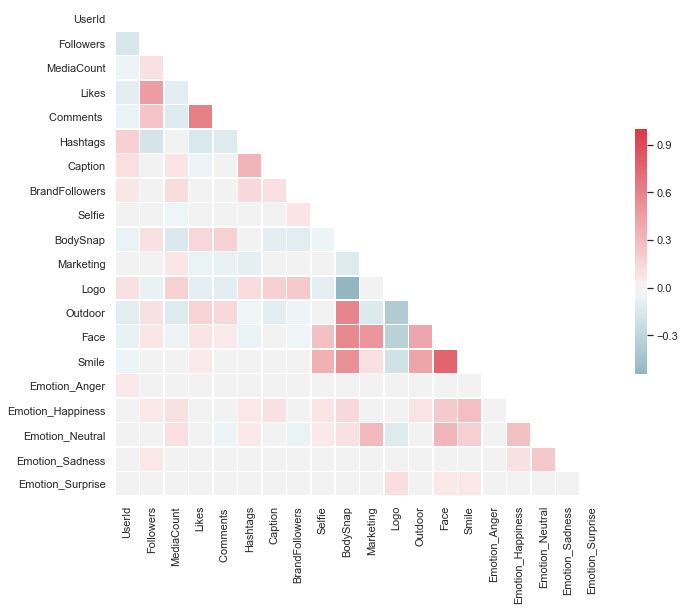

In [15]:
sns.set(style="white")
# Compute the correlation matrix

corr = data2.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [16]:
data2=data2.drop(data2.Likes.idxmax())

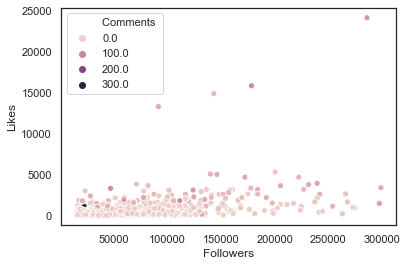

In [17]:
sns.scatterplot(data=data2,x='Followers',y='Likes',hue='Comments ');

In [18]:
data2.Likes.corr(data2.Followers)

0.47115642540720337

In [19]:
df.Likes.corr(df.Followers)

0.867658801811564

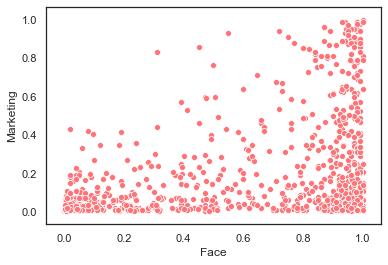

In [20]:
sns.scatterplot(data=data2,x=data2.Face[data2.Face!=0],y=data2.Marketing[data2.Marketing!=0],color='#ff7276');

In [21]:
data2.Face[data2.Face!=0].corr(data2.Marketing[data2.Marketing!=0])

0.4509553735981483

In [22]:
df.Face[df.Face!=0].corr(df.Marketing[df.Marketing!=0])

0.47898456001518364

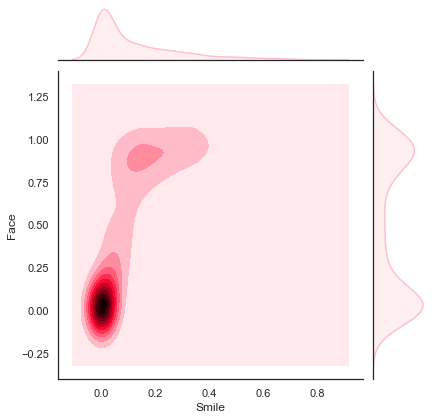

In [23]:
sns.jointplot(x='Smile',y='Face',data=data2,color='pink',kind='kde')

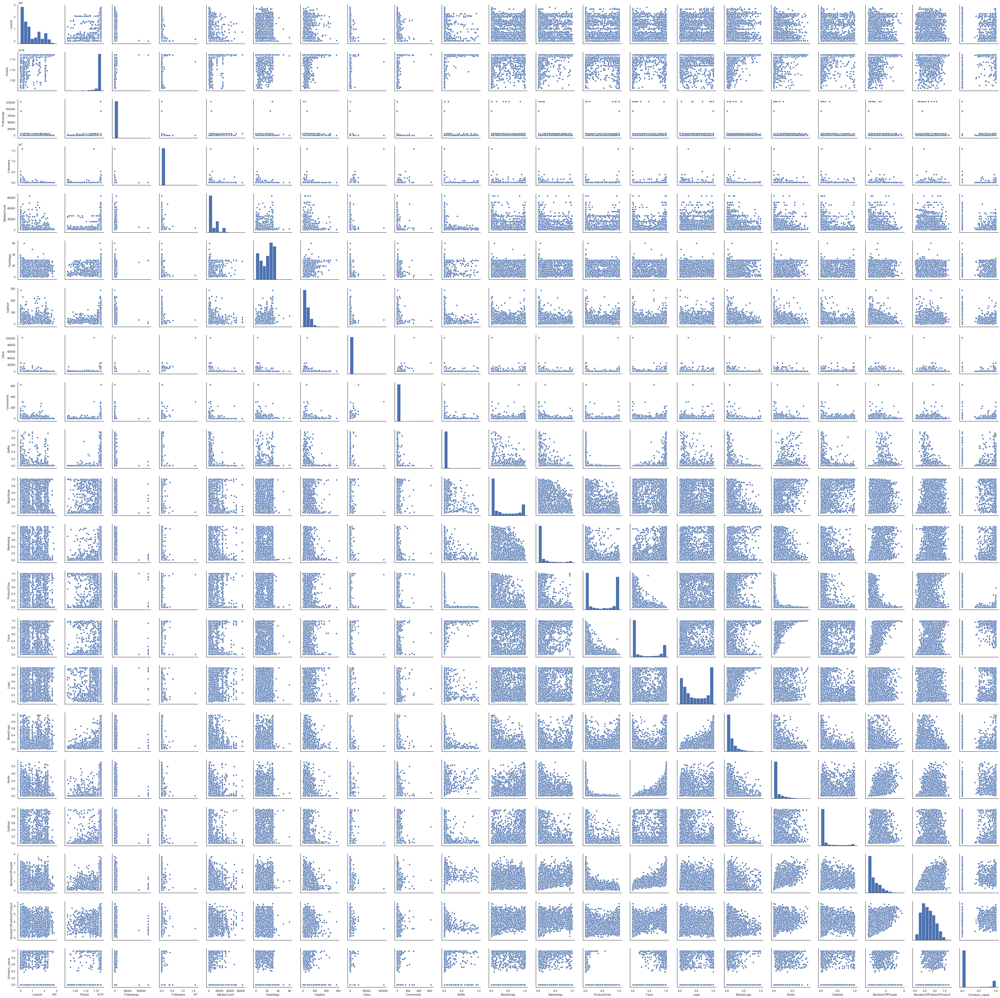

In [24]:
sns.pairplot(df)

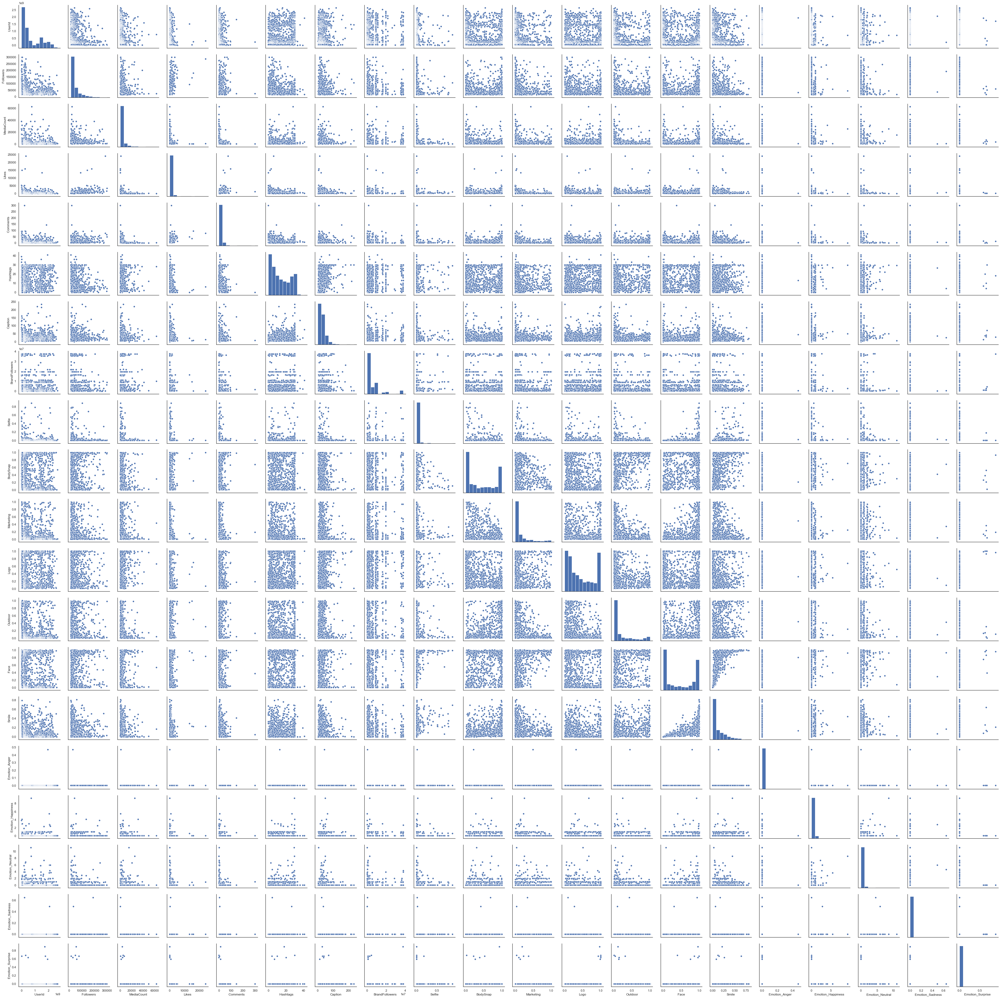

In [21]:
sns.pairplot(data2)

In [25]:
data2.BodySnap.corr(data2.Likes)

0.15135492835871905

In [26]:
data2.Face.corr(data2.Likes)

0.07843237319171338

In [27]:
df.BodySnap.corr(df.Likes)

0.08401574136853714

In [28]:
df.Face.corr(df.Likes)

0.089592045078307

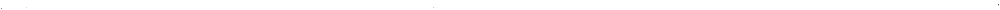

In [29]:
sns.relplot(x='Followers',y='Likes',data=data2,
          kind='line',hue='Comments ',col='BrandName');

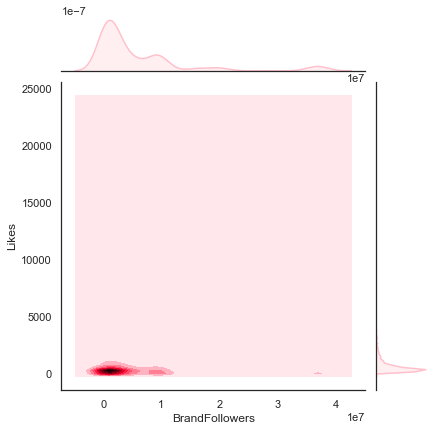

In [30]:
sns.jointplot(x='BrandFollowers',y='Likes',data=data2,color='pink',kind='kde')

In [31]:
df.BrandFollowers=df.BrandFollowers.str.replace(" ",'')
df.BrandFollowers=df.BrandFollowers.astype('int64')

In [32]:
features=['Followers', 'MediaCount', 'Likes', 'Comments ', 'Hashtags',
          'BrandFollowers', 'Selfie', 'BodySnap','Marketing', 'Logo', 'Outdoor', 
          'Face', 'Smile', 'Emotion_Anger','Emotion_Happiness', 'Emotion_Neutral', 
          'Emotion_Sadness','Emotion_Surprise']

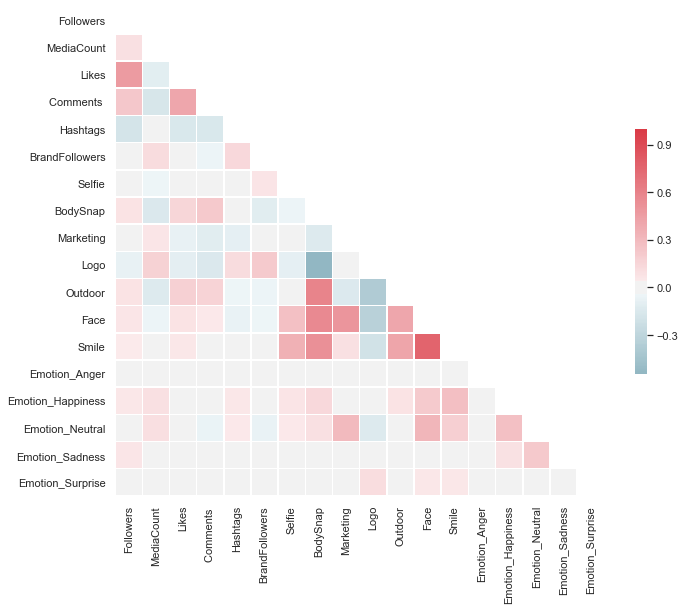

In [34]:
sns.set(style="white")
# Compute the correlation matrix

corr = data2[features].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [35]:
data2.Emotion_Happiness.corr(data2.Smile)

0.28235655149996763

In [36]:
df2.Emotion_Happiness.corr(df2.Smile)

0.4429865914975567

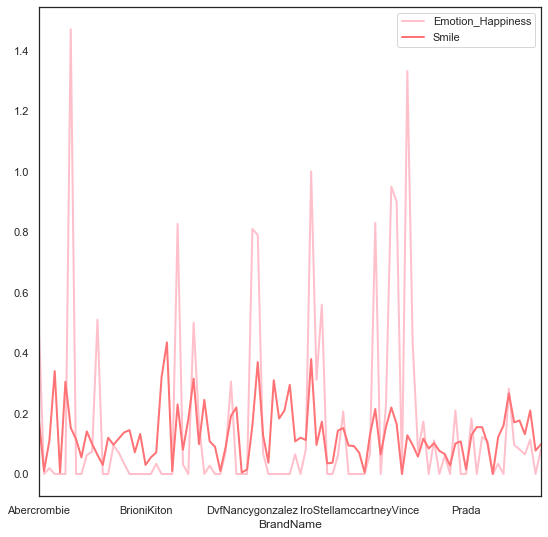

In [37]:
data2.groupby('BrandName')[['Emotion_Happiness','Smile']].mean().plot(figsize=[9,9],color=['pink','#ff7276'],linewidth=2)

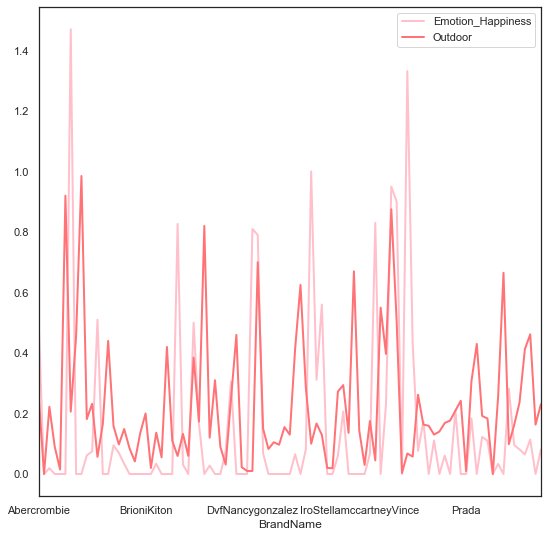

In [38]:
data2.groupby('BrandName')[['Emotion_Happiness','Outdoor']].mean().plot(figsize=[9,9],color=['pink','#ff7276'],linewidth=2)

In [39]:
df2.Emotion_Happiness.corr(df2.Outdoor)

0.14333448478119973

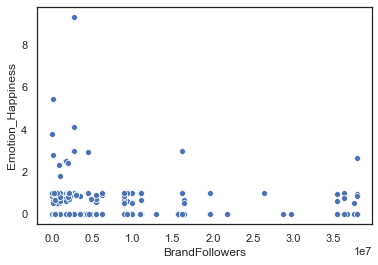

In [40]:
sns.scatterplot(data=data2,x='BrandFollowers',y='Emotion_Happiness');

In [41]:
data2.BrandFollowers.corr(data2.Emotion_Happiness)

-0.015705088239028185

In [42]:
data2.BrandFollowers.corr(data2.Logo)

0.21182215188793177

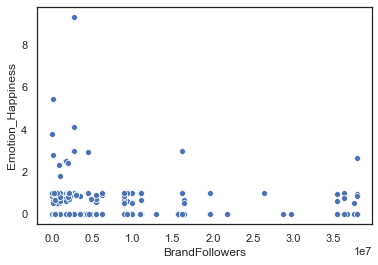

In [43]:
sns.scatterplot(data=data2,x='BrandFollowers',y='Emotion_Happiness');

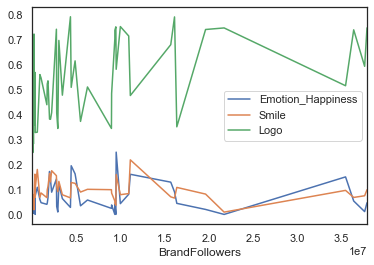

In [44]:
df2.groupby('BrandFollowers')[['Emotion_Happiness','Smile','Logo']].mean().plot()

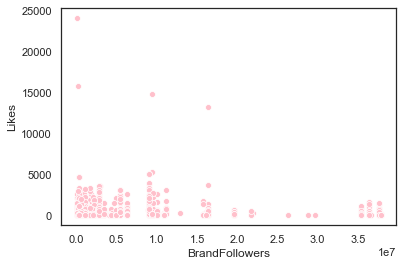

In [45]:
sns.scatterplot(x='BrandFollowers',y='Likes',data=data2,color='pink')

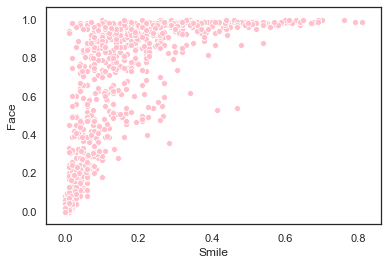

In [46]:
sns.scatterplot(x='Smile',y='Face',data=data2,color='pink')

In [47]:
data2.Smile.corr(data2.Face)

0.7660750908916262

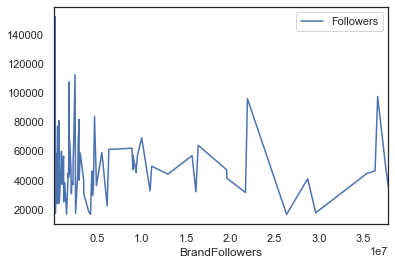

In [48]:
data2.groupby('BrandFollowers')[['Followers']].mean().plot()

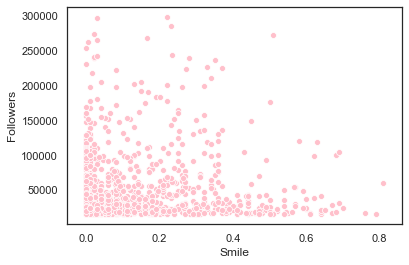

In [49]:
sns.scatterplot(x='Smile',y='Followers',data=data2,color='pink')

In [50]:
data2.Smile.corr(data2.Followers)

0.041640876637029145

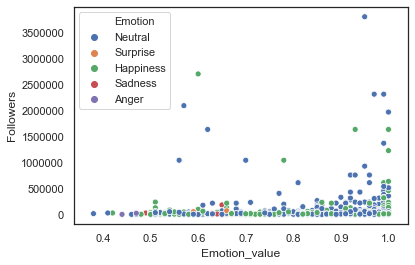

In [51]:
sns.scatterplot(x='Emotion_value',y='Followers',data=df,hue='Emotion')

In [52]:
df.Emotion_value[(df.Followers<20000)&(df.Emotion_value.isna()==False)].corr(df.Followers[(df.Followers<20000)&(df.Emotion_value.isna()==False)])

-0.08602831277287118

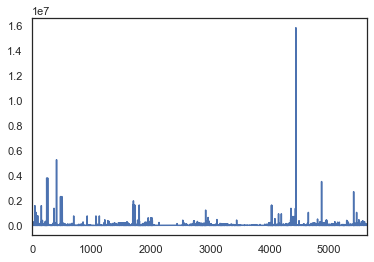

In [53]:
df2.Followers.plot()

In [91]:
df3=df2.groupby('BrandName').agg({"Emotion_Anger":'mean',"Emotion_Happiness":'mean',"Emotion_Neutral":'mean',"Emotion_Sadness":'mean',
                                   "Emotion_Surprise":'mean','BrandFollowers':'mean'}).copy().reset_index()

In [92]:
df3.head()

,BrandName,Emotion_Anger,Emotion_Happiness,Emotion_Neutral,Emotion_Sadness,Emotion_Surprise,BrandFollowers
0,Abercrombie,0.0,0.195333,0.059333,0.0,0.045333,4429473
1,Acnestudios,0.0,0.032128,0.194752,0.0,0.000000,2790522
2,Alexandermcqueen,0.0,0.037982,0.153303,0.0,0.000000,8998663
3,Alexanderwang,0.0,0.034534,0.132236,0.0,0.000000,5482894
4,Americanapparel,0.0,0.066705,0.243068,0.0,0.000000,1806192


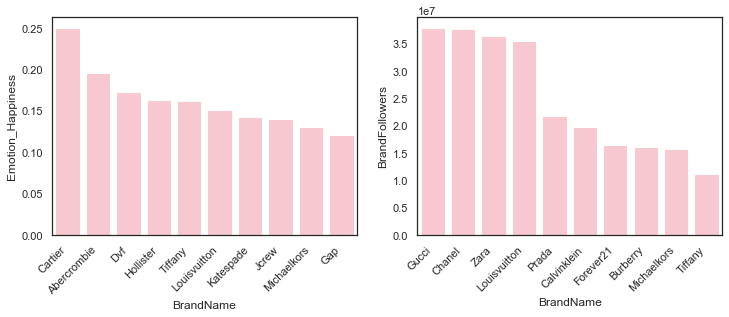

In [106]:
# Create bars
fig, axes=plt.subplots(1,2,figsize=(12,4))
df4=df3.sort_values(['Emotion_Happiness']).copy()
df5=df3.sort_values(['BrandFollowers']).copy()
df4=df4.nlargest(10, 'Emotion_Happiness').copy()
df5=df5.nlargest(10, 'BrandFollowers').copy()
a=sns.barplot(x='BrandName',y='Emotion_Happiness',data=df4,ax=axes[0],color='pink')
b=sns.barplot(x='BrandName',y='BrandFollowers',data=df5,ax=axes[1],color='pink')
a.set_xticklabels(a.get_xticklabels(),rotation=45,horizontalalignment='right')
b.set_xticklabels(b.get_xticklabels(),rotation=45,horizontalalignment='right')

plt.show()

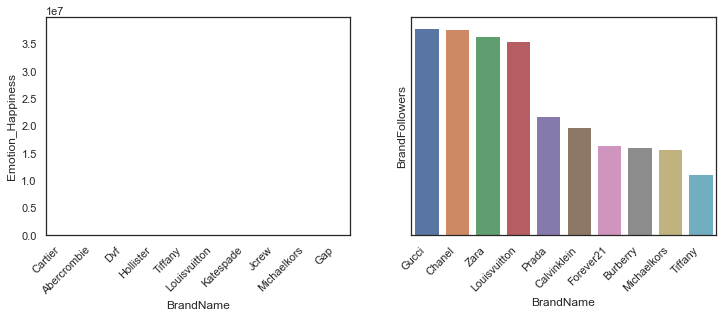

In [104]:
# Create bars
fig, axes=plt.subplots(1,2,sharey=True,figsize=(12,4))
df4=df3.sort_values(['Emotion_Happiness']).copy()
df5=df3.sort_values(['BrandFollowers']).copy()
df4=df4.nlargest(10, 'Emotion_Happiness').copy()
df5=df5.nlargest(10, 'BrandFollowers').copy()
a=sns.barplot(x='BrandName',y='Emotion_Happiness',data=df4,ax=axes[0])
b=sns.barplot(x='BrandName',y='BrandFollowers',data=df5,ax=axes[1])
a.set_xticklabels(a.get_xticklabels(),rotation=45,horizontalalignment='right')
b.set_xticklabels(b.get_xticklabels(),rotation=45,horizontalalignment='right')

plt.show()